# AI Project 4 - Mohsen Amjadi 810896043

### In this project we are going to build some prediction models and the goal is to predict the sales price for each house and evaluate that how is the trained model accuracy. for this purpose we are going to use some machine learning techniques and data analysis and also preproccesing tasks to provide better understanding of our data and also better models. ###

In [72]:
import numpy as np
import pandas as pd
# data visualization
import matplotlib.pyplot as plt
import seaborn as sns
# stat on data
from scipy import stats
from scipy.stats import norm, skew 
# # import library for machine learning
from sklearn import preprocessing, model_selection, metrics
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score, mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn import tree

<h2> Load and check the data <h2/>

In [2]:
df_train = pd.read_csv('./house-prices-advanced-regression-techniques/train.csv')
df_train = df_train.drop(columns=['Id'],axis=1)
df_test = pd.read_csv('./house-prices-advanced-regression-techniques/test.csv')
df_test = df_test.drop(columns=['Id'],axis=1)

In [3]:
df_train['SalePrice']

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [4]:
print('Shape of the file:')
print(df_train.shape)

Shape of the file:
(1460, 80)


In [5]:
df_train.describe()
#df_test.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [6]:
df_train.info()
#df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

<h3> Verify NaN value: <h3/>
<p> First thing to do is get rid of the features with more than 80% missing values (figure below). For example the PoolQC's missing values are probably due to the lack of pools in some buildings, which is very logical. But replacing those (more than 80%) missing values with "no pool" will leave us with a feature with low variance, and low variance features are uniformative for machine learning models. So we drop the features with more than 80% missing values.

PS: In this version, I lower the threshold to 20% to drop more columns <p/>

In [7]:
def msv1(data, thresh=20, color='black', edgecolor='black', width=15, height=3):
    plt.figure(figsize=(width,height))
    percentage=(data.isnull().mean())*100
    percentage.sort_values(ascending=False).plot.bar(color=color, edgecolor=edgecolor)
    plt.axhline(y=thresh, color='r', linestyle='-')
    plt.title('Missing values percentage per column', fontsize=20, weight='bold' )
    plt.text(len(data.isnull().sum()/len(data))/1.7, thresh+12.5, f'Columns with more than {thresh}% missing values', fontsize=12, color='crimson',
         ha='left' ,va='top')
    plt.text(len(data.isnull().sum()/len(data))/1.7, thresh - 5, f'Columns with less than {thresh}% missing values', fontsize=12, color='green',
         ha='left' ,va='top')
    plt.xlabel('Columns', size=15, weight='bold')
    plt.ylabel('Missing values percentage')
    plt.yticks(weight ='bold')
    
    return plt.show()

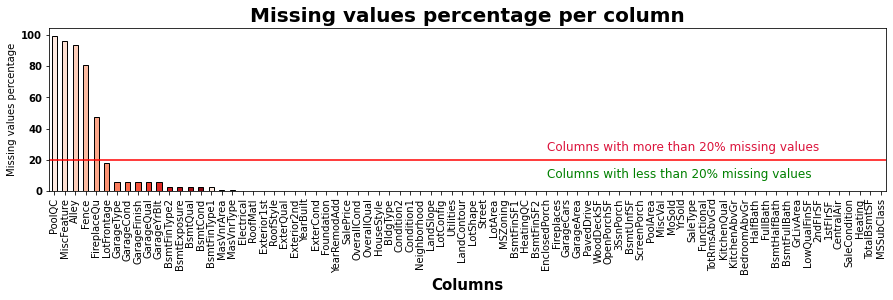

In [8]:
msv1(df_train, 20, color=sns.color_palette('Reds',15))

In [9]:
df_train = df_train.dropna(thresh=len(df_train)*0.8, axis=1)

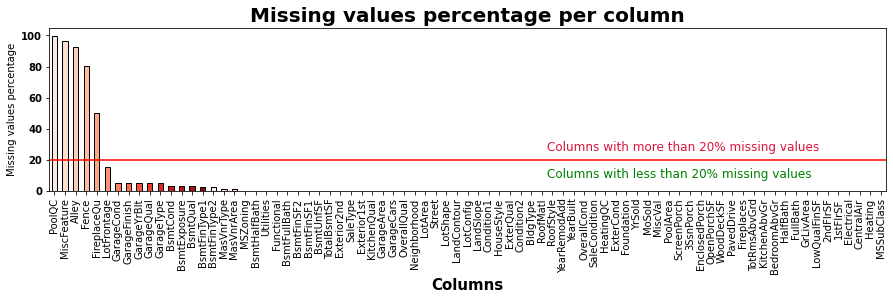

In [10]:
msv1(df_test, 20, color=sns.color_palette('Reds',15))

In [11]:
df_test = df_test.dropna(thresh=len(df_test)*0.8, axis=1)

<h2 >merge test and train data <h2/>

In [12]:
ntrain = df_train.shape[0]
ntest = df_test.shape[0]
target = df_train[['SalePrice']]
all_data = pd.concat((df_train, df_test)).reset_index(drop=True)
all_data.drop(['SalePrice'], axis=1, inplace=True)
print("all_data size is : {}".format(all_data.shape))

all_data size is : (2919, 74)


<h2 > replace nan values <h2/>

In [13]:
# create list with columns having NaN values
col_with_NaN_value = all_data.columns[all_data.isnull().any()]
# create df with only columns having NaN value 
df_nan = all_data[col_with_NaN_value]
# count number of NaN value per columns
print('Number of NaN values')
print('-'*30)
df_nan.isnull().sum()

Number of NaN values
------------------------------


MSZoning          4
LotFrontage     486
Utilities         2
Exterior1st       1
Exterior2nd       1
MasVnrType       24
MasVnrArea       23
BsmtQual         81
BsmtCond         82
BsmtExposure     82
BsmtFinType1     79
BsmtFinSF1        1
BsmtFinType2     80
BsmtFinSF2        1
BsmtUnfSF         1
TotalBsmtSF       1
Electrical        1
BsmtFullBath      2
BsmtHalfBath      2
KitchenQual       1
Functional        2
GarageType      157
GarageYrBlt     159
GarageFinish    159
GarageCars        1
GarageArea        1
GarageQual      159
GarageCond      159
SaleType          1
dtype: int64

In [14]:
def replace_nan_value(df):
    # LotFrontage: replace Nan By mean
    df['LotFrontage'] = df['LotFrontage'].fillna(df['LotFrontage'].mean())
    df['BsmtFinSF1'] = df['BsmtFinSF1'].fillna(df['BsmtFinSF1'].mean())
    df['BsmtFinSF2'] = df['BsmtFinSF2'].fillna(df['BsmtFinSF2'].mean())
    df['BsmtUnfSF'] = df['BsmtUnfSF'].fillna(df['BsmtUnfSF'].mean())
    df['TotalBsmtSF'] = df['TotalBsmtSF'].fillna(df['TotalBsmtSF'].mean())
    
    # Alley,MasVnrType,Bsmtcond,BsmtExposure,BsmtFinType1,Garage : replace nan by none
    df['MasVnrType'] = df['MasVnrType'].replace(np.nan, 'none')
    df['BsmtCond'] = df['BsmtCond'].replace(np.nan, 'none')
    df['BsmtExposure'] = df['BsmtExposure'].replace(np.nan, 'none')
    df['BsmtFinType1'] = df['BsmtFinType1'].replace(np.nan, 'none')
    df['GarageType'] = df['GarageType'].replace(np.nan, 'none')
    df['GarageFinish'] = df['GarageFinish'].replace(np.nan, 'none')
    df['GarageQual'] = df['GarageQual'].replace(np.nan, 'none')
    df['GarageCond'] = df['GarageCond'].replace(np.nan, 'none')
    # MasVnrArea, BsmtQual : replace nan by '0',(because MasVnrType = none)
    df['MasVnrArea'] = df['MasVnrArea'].fillna(0)
    df['BsmtQual'] = df['BsmtQual'].fillna(0)
    df['BsmtFullBath'] = df['BsmtFullBath'].fillna(0)
    df['BsmtHalfBath'] = df['BsmtHalfBath'].fillna(0)    
    # BsmtFinType2: replace nan by '0' if BsmtFinType1 = none else by average
    df.loc[df['BsmtFinType1'] == 'none', 'BsmtFinType2'] = 'none'
    return df

In [15]:
replace_nan_value(all_data)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,61,0,0,0,0,0,2,2008,WD,Normal
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,0,5,2007,WD,Normal
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,42,0,0,0,0,0,9,2008,WD,Normal
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,35,272,0,0,0,0,2,2006,WD,Abnorml
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,84,0,0,0,0,0,12,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,160,RM,21.0,1936,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,0,6,2006,WD,Normal
2915,160,RM,21.0,1894,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,24,0,0,0,0,0,4,2006,WD,Abnorml
2916,20,RL,160.0,20000,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,0,9,2006,WD,Abnorml
2917,85,RL,62.0,10441,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,32,0,0,0,0,700,7,2006,WD,Normal


In [16]:
all_data['BsmtFinType2'] = all_data['BsmtFinType2'].replace(np.nan,'Unf')
# Electrical: replace by standard
all_data['Electrical'] = all_data['Electrical'].replace(np.nan,'SBrkr')
all_data['Utilities'] = all_data['Utilities'].replace(np.nan, 'AllPub')
all_data['Exterior1st'] = all_data['Exterior1st'].replace(np.nan, 'VinylSd')
all_data['Exterior2nd'] = all_data['Exterior2nd'].replace(np.nan, 'VinylSd')
all_data['MSZoning'] = all_data['MSZoning'].replace(np.nan, 'RL')
all_data['KitchenQual'] = all_data['KitchenQual'].replace(np.nan, 'TA')
all_data['Functional'] = all_data['Functional'].replace(np.nan, 'Typ')
all_data['GarageCars'] = all_data['GarageCars'].fillna(2)
all_data['GarageArea'] = all_data['GarageArea'].fillna(519.042857)
all_data['SaleType'] = all_data['SaleType'].replace(np.nan, 'WD')

In [17]:
# verify if still NaN values:
col_with_NaN_value_all_data = all_data.columns[all_data.isnull().any()]
print(len(col_with_NaN_value_all_data))

1


<p > One column corresponding to the year the garage was built, here NaN because no garage. columns will be transformed as categorical variables <p/>

<AxesSubplot:xlabel='Electrical', ylabel='count'>

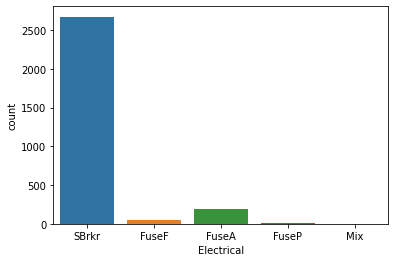

In [18]:
# To replace the nan values in the remaining columns, we used countplot to see the dominant category
sns.countplot(x='Electrical',data=all_data)

<h2 >Verify dtypes: <h2/ >

In [19]:
# df_train.dtypes[df_train.dtypes == 'int64']
# df_train.dtypes[df_train.dtypes == 'float64']
list_var_cat = df_train.dtypes[df_train.dtypes != 'int64'][df_train.dtypes != 'float64']

In [20]:
list_var_cat

MSZoning         object
Street           object
LotShape         object
LandContour      object
Utilities        object
LotConfig        object
LandSlope        object
Neighborhood     object
Condition1       object
Condition2       object
BldgType         object
HouseStyle       object
RoofStyle        object
RoofMatl         object
Exterior1st      object
Exterior2nd      object
MasVnrType       object
ExterQual        object
ExterCond        object
Foundation       object
BsmtQual         object
BsmtCond         object
BsmtExposure     object
BsmtFinType1     object
BsmtFinType2     object
Heating          object
HeatingQC        object
CentralAir       object
Electrical       object
KitchenQual      object
Functional       object
GarageType       object
GarageFinish     object
GarageQual       object
GarageCond       object
PavedDrive       object
SaleType         object
SaleCondition    object
dtype: object

 <h2 >Features engineering <h2/ >


In [21]:
def new_feature(df):
    df['TotalArea'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF'] + df['GrLivArea'] +df['GarageArea']
    df['Bathrooms'] = df['FullBath'] + df['HalfBath']*0.5 
    df['Year average']= (df['YearRemodAdd']+df['YearBuilt'])/2
    return df

In [22]:
new_feature(all_data)
new_feature(df_train)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotalArea,Bathrooms,Year average
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,2,2008,WD,Normal,208500,4824,2.5,2003.0
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,5,2007,WD,Normal,181500,4246,2.0,1976.0
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,9,2008,WD,Normal,223500,5100,2.5,2001.5
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,0,0,2,2006,WD,Abnorml,140000,4832,1.0,1942.5
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,12,2008,WD,Normal,250000,6377,2.5,2000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,8,2007,WD,Normal,175000,4707,2.5,1999.5
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,2,2010,WD,Normal,210000,6188,2.0,1983.0
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,2500,5,2010,WD,Normal,266500,6084,2.0,1973.5
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,4,2010,WD,Normal,142125,3474,1.0,1973.0


<h2 >Collapsing data into categories <h2/ >

GarageYrBlt: int to categorical

In [23]:
# get stat:
all_data['GarageYrBlt'].describe()

count    2760.000000
mean     1978.113406
std        25.574285
min      1895.000000
25%      1960.000000
50%      1979.000000
75%      2002.000000
max      2207.000000
Name: GarageYrBlt, dtype: float64

In [24]:
def garage_year_to_cat(df):
    # assign 0 if no garage:
    df['GarageYrBlt'] = df['GarageYrBlt'].fillna(1)
    # Using cut() - create category ranges and names: is year = 1 then 'never'
    ranges = [0,1899,1925,1950,1975,2000,2020]
    group_garage_year_built = ['never','inf 1925', '1925-1950', '1950-1975','1975-2000','2000-2020']
    # Create income group column
    df['GarageYrBlt_group'] = pd.cut(df['GarageYrBlt'], bins=ranges,labels=group_garage_year_built)
    # drop column GarageYrBlt':
    df = df.drop(['GarageYrBlt'], axis=1)

garage_year_to_cat(all_data)
garage_year_to_cat(df_train)

<h2 >Verify Value consistency <h2/ > 

In [25]:
# Print unique values for categorical variables:
print('MasVnrType: ', all_data['MasVnrType'].unique(), "\n")
print('LotShape', all_data['LotShape'].unique(), "\n")
print('LandContour', all_data['LandContour'].unique(), "\n")
print('Utilities', all_data['Utilities'].unique(), "\n")            ## two Utilies do not appear in the test set
print('LotConfig', all_data['LotConfig'].unique(), "\n")
print('LandSlope', all_data['LandSlope'].unique(), "\n")
print('Neighborhood', all_data['Neighborhood'].unique(), "\n")  
print('Condition1', all_data['Condition1'].unique(), "\n")
print('Condition2', all_data['Condition1'].unique(), "\n")
print('RoofStyle', all_data['RoofStyle'].unique(), "\n")
print('Exterior2nd', all_data['Exterior2nd'].unique(), "\n")

MasVnrType:  ['BrkFace' 'None' 'Stone' 'BrkCmn' 'none'] 

LotShape ['Reg' 'IR1' 'IR2' 'IR3'] 

LandContour ['Lvl' 'Bnk' 'Low' 'HLS'] 

Utilities ['AllPub' 'NoSeWa'] 

LotConfig ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3'] 

LandSlope ['Gtl' 'Mod' 'Sev'] 

Neighborhood ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste'] 

Condition1 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe'] 

Condition2 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe'] 

RoofStyle ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed'] 

Exterior2nd ['VinylSd' 'MetalSd' 'Wd Shng' 'HdBoard' 'Plywood' 'Wd Sdng' 'CmentBd'
 'BrkFace' 'Stucco' 'AsbShng' 'Brk Cmn' 'ImStucc' 'AsphShn' 'Stone'
 'Other' 'CBlock'] 



<h2 > Collapsing too many categories to few <h2/ > 

In [26]:
def collapsing_cat(df):
    # merge IR1= 'Slightly irregular' with IR2 = 'Moderately Irregular'
    df.loc[df['LotShape'] == 'IR2', 'LotShape'] = 'IR1'

    # simplity category to: 200ft of an RR and adjacent to a RR 
    df.loc[(df['Condition1'] == 'RRNn')|(df['Condition1'] == 'RRNe'), 'Condition1'] = '200ft_RR'
    df.loc[(df['Condition1'] == 'RRAn')|(df['Condition1'] == 'RRAe'), 'Condition1'] = 'ADJ_RR'

    df.loc[(df['Condition2'] == 'RRNn')|(df['Condition2'] == 'RRNe'), 'Condition2'] = '200ft_RR'
    df.loc[(df['Condition2'] == 'RRAn')|(df['Condition2'] == 'RRAe'), 'Condition2'] = 'ADJ_RR'

    # simplify RoofMatl to: wood
    df.loc[(df['RoofMatl'] == 'WdShake')|(df['RoofMatl'] == 'WdShngl'), 'RoofMatl'] = 'wood'

    # simplify Exterior1s: base on appearance stone.concret,wood, stucco etc..
    df.loc[(df['Exterior1st'] == 'AsbShng')|(df['Exterior1st'] == 'AsphShn')|(df['Exterior1st'] == 'WdShing'), 'Exterior1st'] = 'shingles'
    df.loc[(df['Exterior1st'] == 'BrkComm')|(df['Exterior1st'] == 'BrkFace'), 'Exterior1st'] = 'brick'
    df.loc[(df['Exterior1st'] == 'CBlock')|(df['Exterior1st'] == 'CemntBd')|(df['Exterior1st'] == 'Stone'), 'Exterior1st'] = 'concret'
    df.loc[(df['Exterior1st'] == 'CBlock')|(df['Exterior1st'] == 'CemntBd'), 'Exterior1st'] = 'concret'
    df.loc[(df['Exterior1st'] == 'HdBoard')|(df['Exterior1st'] == 'Plywood')|(df['Exterior1st'] == 'VinylSd')|(df['Exterior1st'] == 'Wd Sdng'), 'Exterior1st'] = 'wood'
    df.loc[(df['Exterior1st'] == 'ImStucc')|(df['Exterior1st'] == 'Stucco'), 'Exterior1st'] = 'Stucco'
    # simplify Exterior2s: base on appearance stone.concret,wood, stucco etc..
    df.loc[(df['Exterior2nd'] == 'AsbShng')|(df['Exterior2nd'] == 'AsphShn')|(df['Exterior2nd'] == 'WdShing'), 'Exterior2nd'] = 'shingles'
    df.loc[(df['Exterior2nd'] == 'BrkComm')|(df['Exterior2nd'] == 'BrkFace'), 'Exterior2nd'] = 'brick'
    df.loc[(df['Exterior2nd'] == 'CBlock')|(df['Exterior2nd'] == 'CemntBd')|(df['Exterior2nd'] == 'Stone'), 'Exterior2nd'] = 'concret'
    df.loc[(df['Exterior2nd'] == 'CBlock')|(df['Exterior2nd'] == 'CemntBd'), 'Exterior2nd'] = 'concret'
    df.loc[(df['Exterior2nd'] == 'HdBoard')|(df['Exterior2nd'] == 'Plywood')|(df['Exterior2nd'] == 'VinylSd')|(df['Exterior2nd'] == 'Wd Sdng'), 'Exterior2nd'] = 'wood'
    df.loc[(df['Exterior2nd'] == 'ImStucc')|(df['Exterior2nd'] == 'Stucco'), 'Exterior2nd'] = 'Stucco'

    # simplify MasVnrType: 
    df.loc[(df['MasVnrType'] == 'BrkCmn')|(df['MasVnrType'] == 'BrkFace'), 'MasVnrType'] = 'brick'

    # simplify heating: 
    df.loc[(df['Heating'] == 'Floor')|(df['Heating'] == 'Wall')|(df['Heating'] == 'Grav'), 'Heating'] = 'furnace'
    df.loc[(df['Heating'] == 'GasA')|(df['Heating'] == 'GasW'), 'Heating'] = 'Gas'

    # simplify Functional: 
    df.loc[(df['Functional'] == 'Min1')|(df['Functional'] == 'Min2'), 'Functional'] = 'Min'
    df.loc[(df['Functional'] == 'Maj1')|(df['Functional'] == 'Maj2'), 'Functional'] = 'Maj'
    return df

In [27]:
collapsing_cat(all_data)
collapsing_cat(df_train)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotalArea,Bathrooms,Year average,GarageYrBlt_group
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,2,2008,WD,Normal,208500,4824,2.5,2003.0,2000-2020
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,5,2007,WD,Normal,181500,4246,2.0,1976.0,1975-2000
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,9,2008,WD,Normal,223500,5100,2.5,2001.5,2000-2020
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,0,2,2006,WD,Abnorml,140000,4832,1.0,1942.5,1975-2000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,12,2008,WD,Normal,250000,6377,2.5,2000.0,1975-2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,8,2007,WD,Normal,175000,4707,2.5,1999.5,1975-2000
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,2,2010,WD,Normal,210000,6188,2.0,1983.0,1975-2000
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,2500,5,2010,WD,Normal,266500,6084,2.0,1973.5,1925-1950
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,4,2010,WD,Normal,142125,3474,1.0,1973.0,1925-1950


<h3 >Making sure all the relevant data are categorical variables.<h3/ >

In [28]:
datatype = all_data.dtypes
list_col_object  = datatype[(datatype == 'object')].index.tolist()
# convert object dtypes to category
for col in list_col_object:
    all_data[col] = all_data[col].astype('category')

# convert int dtypes to category    
def convert_int_to_cat(df):
    df['MSSubClass'] = df['MSSubClass'].astype('category')
    df['OverallQual'] = df['OverallQual'].astype('category')
    df['OverallCond'] = df['OverallCond'].astype('category')
    df['YrSold'] = df['YrSold'].astype('category')
    df['MoSold'] = df['MoSold'].astype('category')
    return df

convert_int_to_cat(all_data)
convert_int_to_cat(df_train)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,TotalArea,Bathrooms,Year average,GarageYrBlt_group
0,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,2,2008,WD,Normal,208500,4824,2.5,2003.0,2000-2020
1,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,5,2007,WD,Normal,181500,4246,2.0,1976.0,1975-2000
2,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,9,2008,WD,Normal,223500,5100,2.5,2001.5,2000-2020
3,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,0,2,2006,WD,Abnorml,140000,4832,1.0,1942.5,1975-2000
4,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,12,2008,WD,Normal,250000,6377,2.5,2000.0,1975-2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,8,2007,WD,Normal,175000,4707,2.5,1999.5,1975-2000
1456,20,RL,85.0,13175,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,2,2010,WD,Normal,210000,6188,2.0,1983.0,1975-2000
1457,70,RL,66.0,9042,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,2500,5,2010,WD,Normal,266500,6084,2.0,1973.5,1925-1950
1458,20,RL,68.0,9717,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,4,2010,WD,Normal,142125,3474,1.0,1973.0,1925-1950


<h2> Analysing target variable: 'SalePrice' <h2/>

In [29]:
#descriptive statistics summary
target['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

<h3>Check the asymmetry of the probability distribution <h3/>


 mu = 180921.20 and sigma = 79415.29



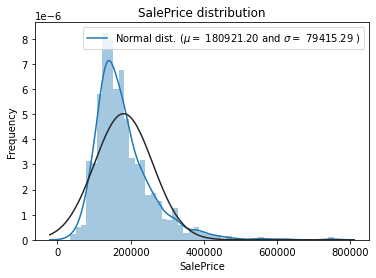

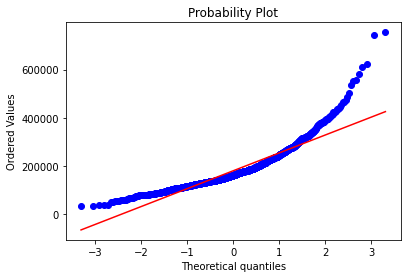

In [30]:
sns.distplot(target['SalePrice'], fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(target['SalePrice'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(target['SalePrice'], plot=plt)
plt.show()

In [31]:
#skewness and kurtosis
print("Skewness: %f" % target['SalePrice'].skew())
print("Kurtosis: %f" % target['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


Skewness is a measure of symmetry, or more precisely, the lack of symmetry. A distribution, or data set, is symmetric if it looks the same to the left and right of the center point. Kurtosis is a measure of whether the data are heavy-tailed or light-tailed relative to a normal distribution.

We can see:
<ul> 
    <li> Deviate from the normal distribution. </li>
    <li> Have appreciable positive skewness. (means that the tail on the right side of the distribution is longer or fatter. The mean and median will be greater than       the mode.)</li>
    <li>High Kurtosis. (means that the data tends to have heavy tails, or outliers)</li>
</ul>

<h3>Log transform skewed numeric features:<h3/>

<p >We want our skewness value to be around 0 and kurtosis less than 3.

Here are two examples of skewed features: Ground living area and 1st floor SF. We will apply np.log1p to the skewed variables. <p/ >


 mu = 12.02 and sigma = 0.40



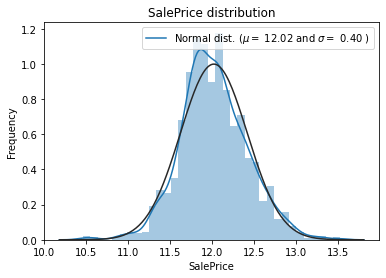

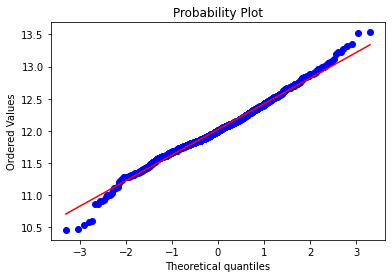

In [32]:
#We use the numpy fuction log1p which  applies log(1+x) to all elements of the column
df_train["SalePrice"] = np.log1p(df_train["SalePrice"])
target['SalePrice'] = np.log1p(target['SalePrice'])
#Check the new distribution 
sns.distplot(target['SalePrice'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(target['SalePrice'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(target['SalePrice'], plot=plt)
plt.show()

In [33]:
#skewness and kurtosis
print("Skewness: %f" % target['SalePrice'].skew())
print("Kurtosis: %f" % target['SalePrice'].kurt())

Skewness: 0.121347
Kurtosis: 0.809519


Now, the skew seems corrected and the data appears more normally distributed.

<h3 >Skewed features:<h3/ >

In [34]:
list_col_numeric = all_data.dtypes[all_data.dtypes != "category"].index
# Check the skew of all numerical features
skewed_feats = all_data[list_col_numeric].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
print("\nSkew in numerical features: \n")
skewness = pd.DataFrame({'Skew' :skewed_feats})
skewness.head(5)


Skew in numerical features: 



,Skew
MiscVal,21.947195
PoolArea,16.898328
LotArea,12.822431
LowQualFinSF,12.088761
3SsnPorch,11.376065


 <h3 >Box Cox Transformation of (highly) skewed features<h3/ >

<p >We use the scipy function boxcox1p which computes the Box-Cox transformation of 1+x .

Note that setting λ=0 is equivalent to log1p used above for the target variable.<p/ >

In [35]:
skewness = skewness[abs(skewness) > 0.75]
print("There are {} skewed numerical features to Box Cox transform".format(skewness.shape[0]))

from scipy.special import boxcox1p
skewed_features = skewness.index
lam = 0.15
for feat in skewed_features:
    #all_data[feat] += 1
    all_data[feat] = boxcox1p(all_data[feat], lam)

There are 34 skewed numerical features to Box Cox transform


In [36]:
# Check the skew of all numerical features
skewed_feats = all_data[list_col_numeric].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
print("\nSkew in numerical features: \n")
skewness = pd.DataFrame({'Skew' :skewed_feats})
skewness.head(5)


Skew in numerical features: 



,Skew
PoolArea,15.119426
3SsnPorch,8.924822
LowQualFinSF,8.744143
MiscVal,5.597060
BsmtHalfBath,3.788243


<h2> Numerical values <h2/> 

<h2> Correlations between variables: heatmap<h2/> 

In [37]:
# update list with categorical variables
updated_datatype = all_data.dtypes
list_col_numeric  = updated_datatype[(updated_datatype != 'category')].index.tolist()
list_col_category = updated_datatype[(updated_datatype == 'category')].index.tolist()

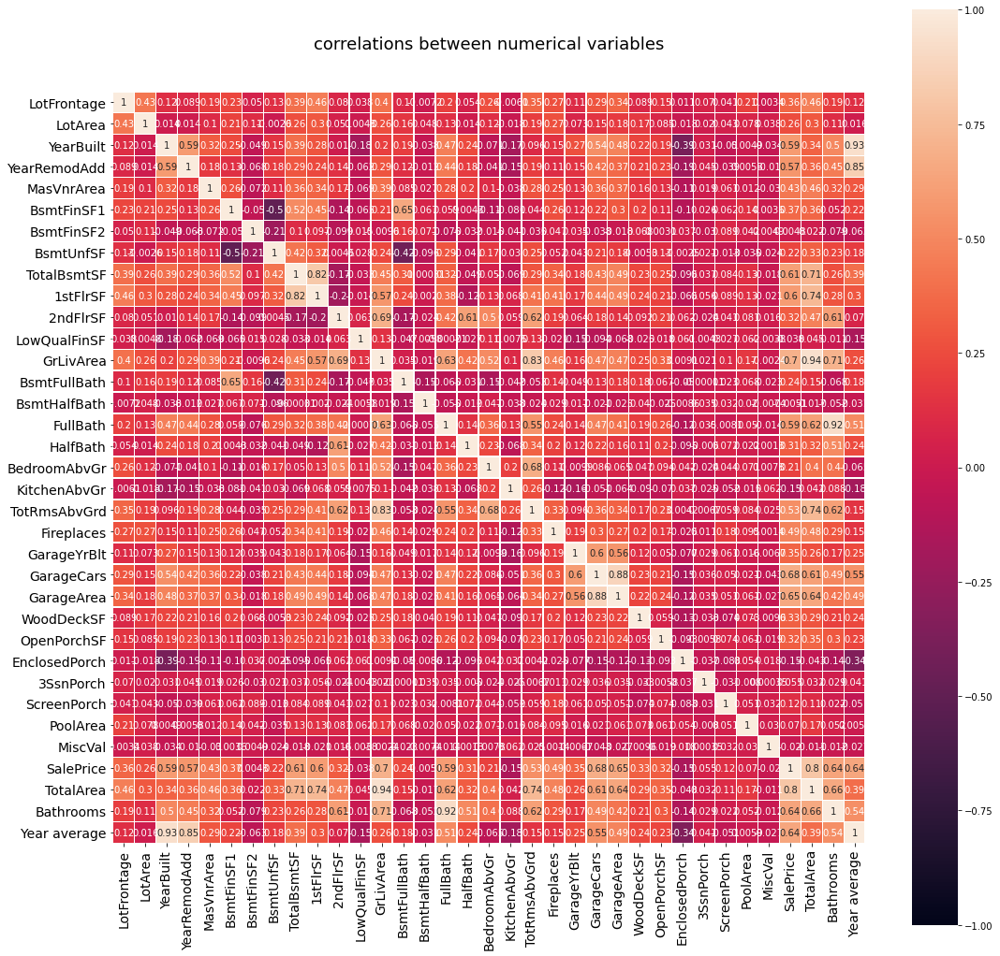

In [38]:
corr = df_train.corr(method='pearson') # pearson : standard correlation coefficient

fig, axes = plt.subplots(1,figsize=(18,18))
ax0 = plt.subplot(1,1,1)
sns.heatmap(corr,annot=True,linewidths=.5, annot_kws={"size": 10},vmin=-1.0, vmax=1.0,square=True,cbar=True)
# bottom, top = ax0.get_ylim()
# ax0.set_ylim(bottom + 0.5, top - 0.5)
ax0.set_title('correlations between numerical variables',size=18,y=1.05)
ax0.set_yticklabels(ax0.get_yticklabels(), rotation=0,size=14) 
ax0.set_xticklabels(ax0.get_xticklabels(), rotation=90,size=14) 
plt.show()

<h2> Observation<h2/> 

<p >As we can see, the multicollinearity still exists in various features. However, we will keep them for now for the sake of learning. Let's go through some of the correlations that still exists.<p/ >

<p >There is 0.83 or 83% correlation between GarageYrBlt and YearBuilt. 83% correlation between TotRmsAbvGrd and GrLivArea. 89% correlation between GarageCars and GarageArea. Similarly many other features such asBsmtUnfSF, FullBath have good correlation with other independent feature. If I were using only multiple linear regression, I would be deleting these features from the dataset to fit better multiple linear regression algorithms. However, we will be using many algorithms as scikit learn modules makes it easy to implement them and get the best possible outcome. Therefore, we will keep all the features for now.<p/ >

In [39]:
def plot_correlation(df,var1,var2,color):
    """
    plot data and a linear regression model fit. 
    Parameters
    ----------
    df : dataframe
    var1: 'column_name' of the variable 1 in df
    var2: 'column_name' of the variable 2 in df
    color : color scatter points
    Returns
    -------
    Figure  
    """
    # transform var1 and var2 into numpy array:
    xm = np.array(df[var1])
    ym = np.array(df[var2])
    # get regression line properties:
        # slope : float
        # slope of the regression line
        # intercept : float
        # intercept of the regression line
        # rvalue : float
        # correlation coefficient
        # pvalue : float
        # two-sided p-value for a hypothesis test whose null hypothesis is that the slope is zero.
        # stderr : float
        # Standard error of the estimate
    
    slope, intercept, r_value, p_value, std_err = stats.linregress(xm, ym)

    # In statistics, the correlation coefficient r measures the strength and direction of a linear relationship between two variables on a scatterplot.

    # Plot linear regression with 95% confidence interval and the regression coefficient
    sns.regplot(var1,var2,data=df,fit_reg=True,color = color,
                line_kws={'label':"R={:.2f}".format(r_value),"color": "black"}) 
    # axes and title properties
    plt.xlabel(var1,fontsize=15)
    plt.ylabel(var2,fontsize=15)
    # plot legend
    plt.legend(prop={'size': 15})
    
def plot_residual(df,var1,var2,color):
    """
    plot the residual plot for independent variable GrLivArea and our target variable SalePrice .the residual plot for independent variable GrLivArea and our target variable SalePrice .
    Parameters
    ----------
    df : dataframe
    var1: 'column_name' of the variable 1 in df
    var2: 'column_name' of the variable 2 in df
    color : color scatter points
    Returns
    -------
    Figure  
    """
    sns.residplot(var1,var2,data=df,color = color)
    # axes and title properties
    plt.xlabel(var1,fontsize=15)
    plt.ylabel(var2,fontsize=15)
    # plot legend
    plt.legend(prop={'size': 15})

<h3> plot correlations and residuals <h3/> 

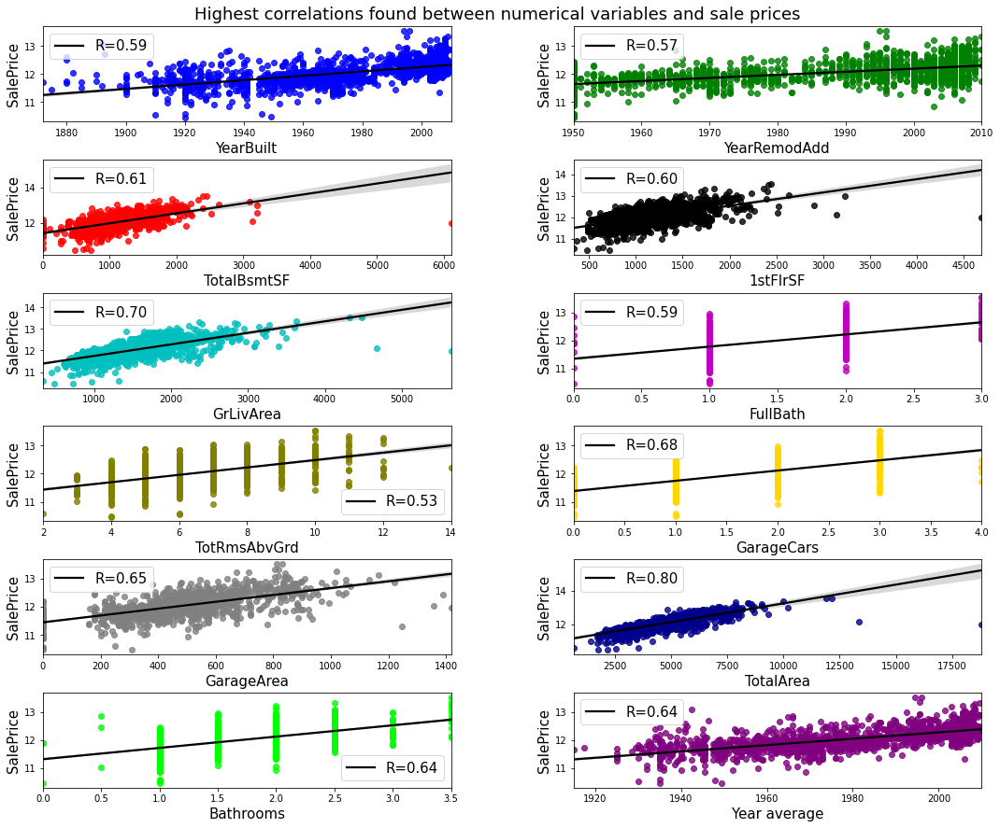

In [40]:
# define figure size
fig = plt.figure(figsize=(18,15))
fig.subplots_adjust(hspace=0.4,wspace=0.3)

# figure title
fig.suptitle('Highest correlations found between numerical variables and sale prices', fontsize=18,y=0.9)

# subplot
ax1 = fig.add_subplot(6,2,1)
ax1 = plot_correlation(df_train,'YearBuilt','SalePrice','blue')
ax2 = fig.add_subplot(6,2,2)
ax2 = plot_correlation(df_train,'YearRemodAdd','SalePrice','green')
ax3 = fig.add_subplot(6,2,3)
ax3 = plot_correlation(df_train,'TotalBsmtSF','SalePrice','red')
ax4 = fig.add_subplot(6,2,4)
ax4 = plot_correlation(df_train,'1stFlrSF','SalePrice','black')
ax5 = fig.add_subplot(6,2,5)
ax5 = plot_correlation(df_train,'GrLivArea','SalePrice','c')
ax6 = fig.add_subplot(6,2,6)
ax6 = plot_correlation(df_train,'FullBath','SalePrice','m')
ax7 = fig.add_subplot(6,2,7)
ax7 = plot_correlation(df_train,'TotRmsAbvGrd','SalePrice','olive')
ax8 = fig.add_subplot(6,2,8)
ax8 = plot_correlation(df_train,'GarageCars','SalePrice','gold')
ax9 = fig.add_subplot(6,2,9)
ax9 = plot_correlation(df_train,'GarageArea','SalePrice','grey')
ax10 = fig.add_subplot(6,2,10)
ax10 = plot_correlation(df_train,'TotalArea','SalePrice','darkblue')
ax9 = fig.add_subplot(6,2,11)
ax9 = plot_correlation(df_train,'Bathrooms','SalePrice','lime')
ax10 = fig.add_subplot(6,2,12)
ax10 = plot_correlation(df_train,'Year average','SalePrice','purple')

plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


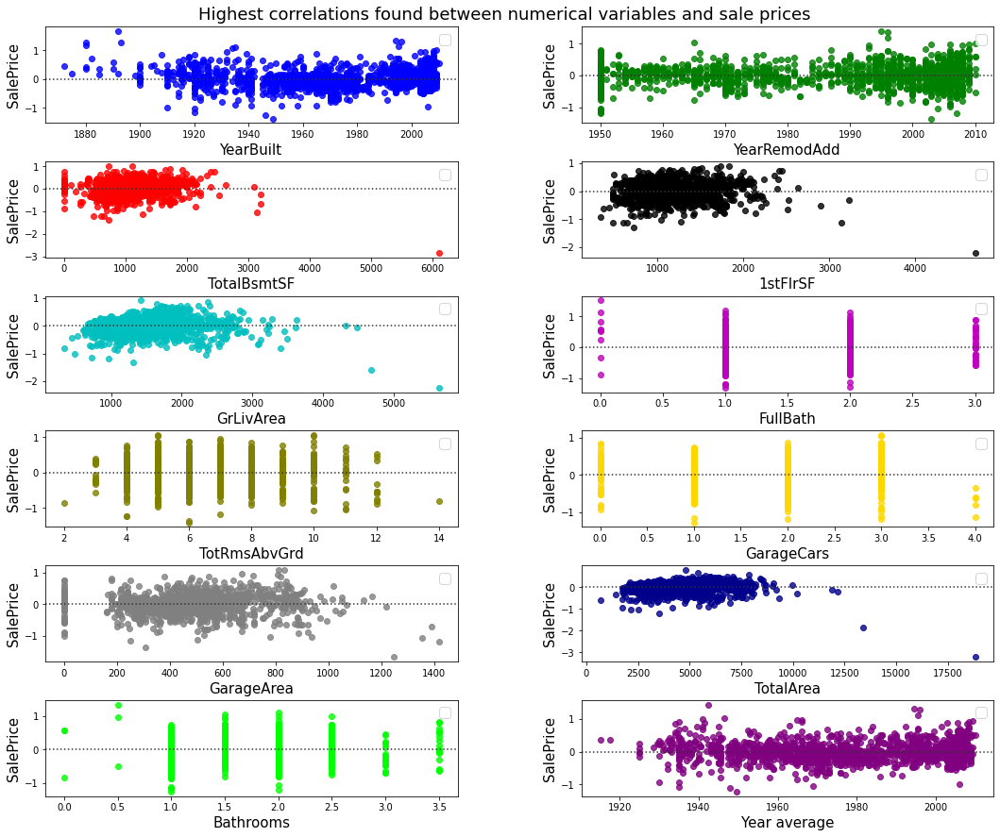

In [41]:
# define figure size
fig = plt.figure(figsize=(18,15))
fig.subplots_adjust(hspace=0.4,wspace=0.3)

# figure title
fig.suptitle('Highest correlations found between numerical variables and sale prices', fontsize=18,y=0.9)

# subplot
ax1 = fig.add_subplot(6,2,1)
ax1 = plot_residual(df_train,'YearBuilt','SalePrice','blue')
ax2 = fig.add_subplot(6,2,2)
ax2 = plot_residual(df_train,'YearRemodAdd','SalePrice','green')
ax3 = fig.add_subplot(6,2,3)
ax3 = plot_residual(df_train,'TotalBsmtSF','SalePrice','red')
ax4 = fig.add_subplot(6,2,4)
ax4 = plot_residual(df_train,'1stFlrSF','SalePrice','black')
ax5 = fig.add_subplot(6,2,5)
ax5 = plot_residual(df_train,'GrLivArea','SalePrice','c')
ax6 = fig.add_subplot(6,2,6)
ax6 = plot_residual(df_train,'FullBath','SalePrice','m')
ax7 = fig.add_subplot(6,2,7)
ax7 = plot_residual(df_train,'TotRmsAbvGrd','SalePrice','olive')
ax8 = fig.add_subplot(6,2,8)
ax8 = plot_residual(df_train,'GarageCars','SalePrice','gold')
ax9 = fig.add_subplot(6,2,9)
ax9 = plot_residual(df_train,'GarageArea','SalePrice','grey')
ax10 = fig.add_subplot(6,2,10)
ax10 = plot_residual(df_train,'TotalArea','SalePrice','darkblue')
ax9 = fig.add_subplot(6,2,11)
ax9 = plot_residual(df_train,'Bathrooms','SalePrice','lime')
ax10 = fig.add_subplot(6,2,12)
ax10 = plot_residual(df_train,'Year average','SalePrice','purple')

plt.show()

<p > Here, we see that the charts on the right have Homoscedasticity(almost an equal amount of variance across the zero lines). It is because we have trainsformed the target variable using numpy.log1p. Overwise, the residual plot may if seems like there is a linear relationship between the response variable (increases in variance associated with the increase of the target variables = Heteroscedasticity). <p/ > 

<h2> Outliers detection: <h2/> 

What is an outlier exactly? It’s a data point that is significantly different from other data points in a data set.

Looking at variables together can help you spot common-sense outliers. Say a study is using both people’s ages and marital status to draw conclusions. If you look at variables separately, you might miss outliers. For example, “12 years old” isn’t an outlier and “widow” isn’t an outlier, but we know that a 12-year-old widow is likely an outlier

For multivariate data, scatterplots can be very effective. Scatterplots show a collection of data points, where the x-axis (horizontal) represents the independent variable and the y-axis (vertical) represents the dependent variable. 

In [42]:
print(df_train['TotalBsmtSF'].sort_values(ascending=False).head(1))
print(df_train['GrLivArea'].sort_values(ascending=False).head(2))
print(df_train['1stFlrSF'].sort_values(ascending=False).head(1))
# print(df_train['TotalArea'].sort_values(ascending=False).head(2))

1298    6110
Name: TotalBsmtSF, dtype: int64
1298    5642
523     4676
Name: GrLivArea, dtype: int64
1298    4692
Name: 1stFlrSF, dtype: int64


In [43]:
positon_outliers = [1298,523]
df_train = df_train.drop(df_train.index[positon_outliers])

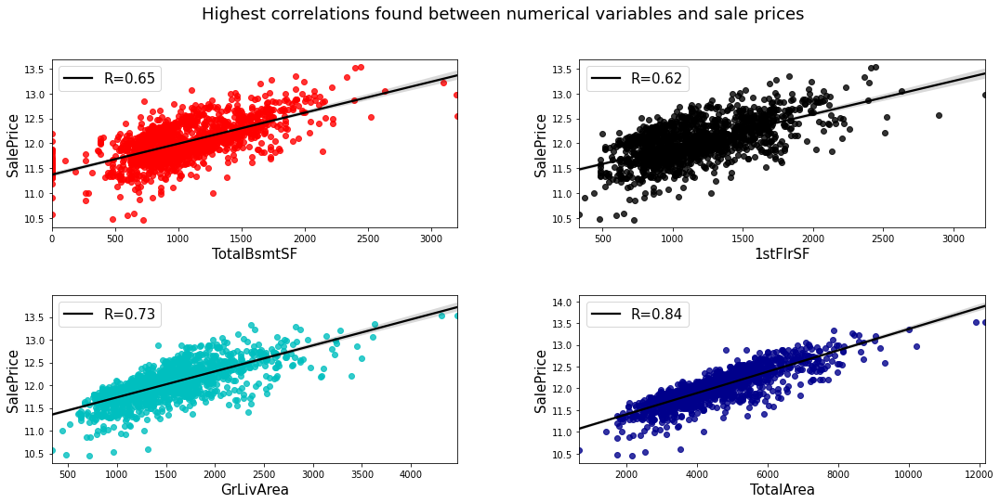

In [44]:
# define figure size
fig = plt.figure(figsize=(18,8))
fig.subplots_adjust(hspace=0.4,wspace=0.3)

# figure title
fig.suptitle('Highest correlations found between numerical variables and sale prices', fontsize=18)

# subplot
ax1 = fig.add_subplot(2,2,1)
ax1 = plot_correlation(df_train,'TotalBsmtSF','SalePrice','red')
ax2 = fig.add_subplot(2,2,2)
ax2 = plot_correlation(df_train,'1stFlrSF','SalePrice','black')
ax3 = fig.add_subplot(2,2,3)
ax3 = plot_correlation(df_train,'GrLivArea','SalePrice','c')
ax4 = fig.add_subplot(2,2,4)
ax4 = plot_correlation(df_train,'TotalArea','SalePrice','darkblue')

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


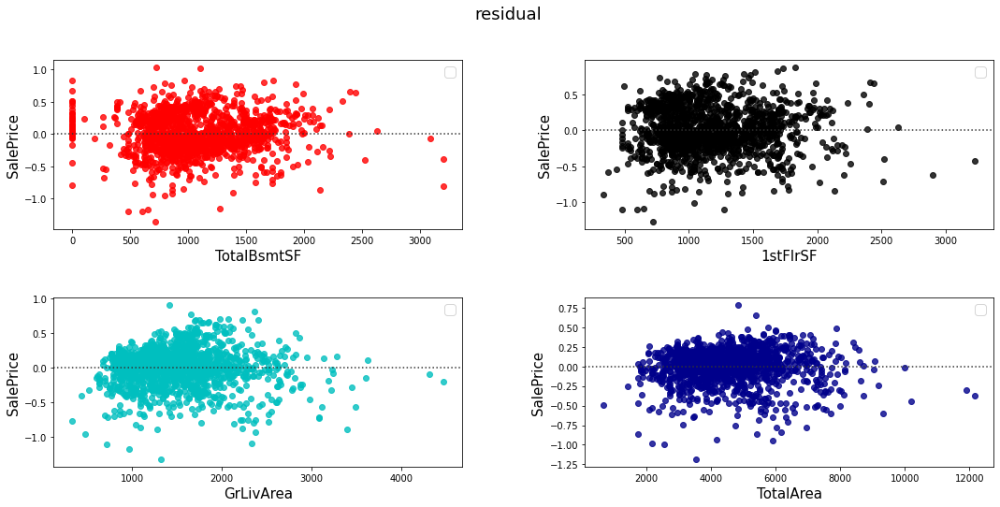

In [45]:
# define figure size
fig = plt.figure(figsize=(18,8))
fig.subplots_adjust(hspace=0.4,wspace=0.3)

# figure title
fig.suptitle('residual', fontsize=18)

# subplot
ax1 = fig.add_subplot(2,2,1)
ax1 = plot_residual(df_train,'TotalBsmtSF','SalePrice','red')
ax2 = fig.add_subplot(2,2,2)
ax2 = plot_residual(df_train,'1stFlrSF','SalePrice','black')
ax3 = fig.add_subplot(2,2,3)
ax3 = plot_residual(df_train,'GrLivArea','SalePrice','c')
ax4 = fig.add_subplot(2,2,4)
ax4 = plot_residual(df_train,'TotalArea','SalePrice','darkblue')

<h3>Categorical variables <h3/>

In [46]:
print(len(list_col_category))

44


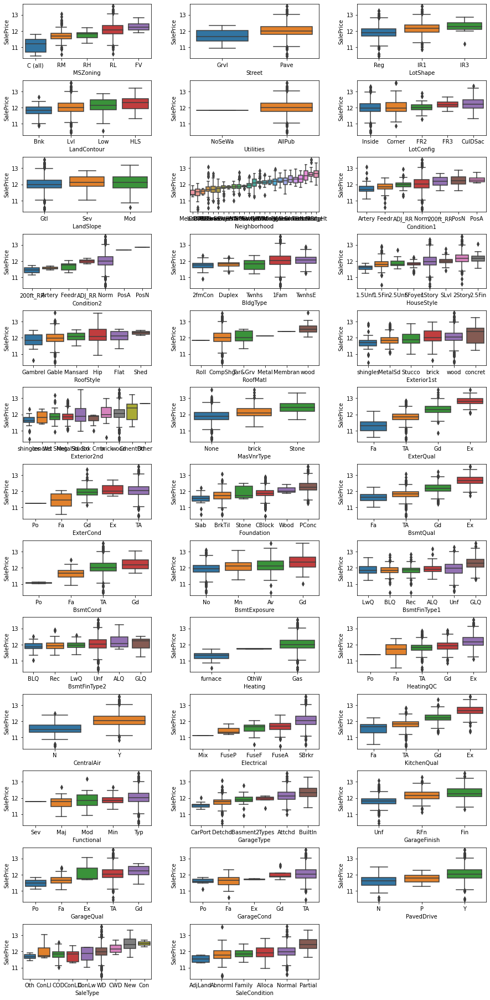

In [47]:
fig = plt.figure(figsize=(15,40))
fig.subplots_adjust(hspace = 0.4, wspace=0.3)

list_col_category = df_train.dtypes[df_train.dtypes == "object"].index
# Create subplot based of target
for i,col in zip (range(1,50),list_col_category):
    # sort boxplot by median value
    grouped = df_train.loc[:,[col, "SalePrice"]].groupby([col]).median().sort_values(by="SalePrice")
    ax = fig.add_subplot(16,3,i)
    ax = sns.boxplot(x=col, y="SalePrice", data=df_train,order = grouped.index)
    
plt.show()

In [48]:
# get dummies
df_all_data = pd.get_dummies(all_data,drop_first = True)

<h3> split the df with all data into the training and testing set<h3/>

In [49]:
df_train2 = df_all_data[:ntrain]
df_test2 = df_all_data[ntrain:]

In [51]:
print(df_train2.shape)
print(df_test2.shape)

(1460, 266)
(1459, 266)


In [52]:
# remove outliers:
positon_outliers = [1298,523]
df_train2 = df_train2.drop(df_train2.index[positon_outliers]).values
target = target.drop(target.index[positon_outliers]).values

<h1> MODEL <h1/>

<h2 > Preprocessing <h2/ > 

<h3 > Split the data <h3/ > 

In [53]:
from sklearn.model_selection import train_test_split
X = df_train2
X_train, X_test, y_train, y_test = train_test_split(X, target,test_size = .3, random_state=0)

<h3 >  Scale the data  <h3/ > 

We use RobustScaler to scale the data because it's powerful against outliers, we already detected some but there must be some other outliers out there.

In [54]:
from sklearn.preprocessing import RobustScaler
scaler= RobustScaler()
# transform "x_train"
X_train = scaler.fit_transform(X_train)
# transform "x_test"
X_test = scaler.transform(X_test)

#Transform the test set
X_df_test= scaler.fit_transform(df_test2)

In [55]:
import math
def score(y_pred):
    return str(math.sqrt(mean_squared_error(y_test, y_pred)))

def get_best_score(grid):
    
    best_score = np.sqrt(-grid.best_score_)
    print(best_score)    
    print(grid.best_params_)
    print(grid.best_estimator_)
    
    return best_score

from statsmodels.graphics.api import abline_plot
def model_evaluation(prediction):
    print("R2 (explained variance):", round(metrics.r2_score(y_test, prediction), 2))
    print("Mean Absolute Perc Error (Σ(|y-pred|/y)/n):", np.mean(np.abs((y_test-prediction)/prediction)))
    print("Mean Absolute Error (Σ|y-pred|/n):", "{:,f}".format(metrics.mean_absolute_error(y_test, prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y-pred)^2/n)):", "{:,f}".format(np.sqrt(metrics.mean_squared_error(y_test, prediction))))
    ## residuals
    prediction = prediction.reshape(len(prediction),1)
    residuals = y_test - prediction
    if abs(max(residuals)) > abs(min(residuals)):
        max_error = max(residuals)  
    else:
        max_error = min(residuals) 
    max_idx = list(residuals).index(max(residuals)) if abs(max(residuals)) > abs(min(residuals)) else list(residuals).index(min(residuals))
    # max_true = y_test[max_idx]
    max_pred = prediction[max_idx]
    print("Max Error:", "{}".format(max_error))
    
    ## Plot predicted vs true
    fig, ax = plt.subplots(nrows=1, ncols=2,figsize=(10,5))
    ax[0].scatter(prediction, y_test, color="black")
    abline_plot(intercept=0, slope=1, color="red", ax=ax[0])
    # ax[0].vlines(x=max_pred, ymin=max_true, ymax=max_true-max_error, color='red', linestyle='--', alpha=0.7, label="max error")
    ax[0].grid(True)
    ax[0].set(xlabel="Predicted", ylabel="True", title="Predicted vs True")
    ax[0].legend()

    ## Plot predicted vs residuals
    ax[1].scatter(prediction, residuals, color="red")
    ax[1].vlines(x=max_pred, ymin=0, ymax=max_error, color='black', linestyle='--', alpha=0.7, label="max error")
    ax[1].grid(True)
    ax[1].set(xlabel="Predicted", ylabel="Residuals", title="Predicted vs Residuals")
    ax[1].hlines(y=0, xmin=np.min(prediction), xmax=np.max(prediction))
    ax[1].legend()
    plt.show()

<h2 >Linear regression <h2/ >

<h3 >GridSearchCV() <h3/ >

In [56]:
# linreg = LinearRegression()
# parameters = {'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}
# grid_linear = GridSearchCV(linreg, parameters, cv=12, verbose=1 , scoring = 'neg_mean_squared_error')
# grid_linear.fit(X_train, y_train)

# sc_linear = get_best_score(grid_linear)

<h3 >Best fit <h3/ >

No handles with labels found to put in legend.
R2 (explained variance): 0.9
Mean Absolute Perc Error (Σ(|y-pred|/y)/n): 0.007341747689696361
Mean Absolute Error (Σ|y-pred|/n): 0.087765
Root Mean Squared Error (sqrt(Σ(y-pred)^2/n)): 0.129062
Max Error: [-0.5842452]


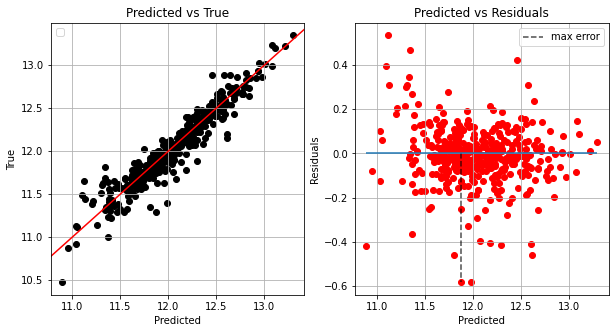

In [57]:
## call model 1 with all the variables
model_LinReg = linear_model.LinearRegression(copy_X= True, fit_intercept= True, normalize= False)
model_LinReg.fit(X_train,y_train)
prediction = model_LinReg.predict(X_test)
model_evaluation(prediction)

<h2> Evaluation Metrics <h2/>

Here I use three metrics for evaluation `Mean Absolute Error`, `Mean Squared Error`, and `Root Mean Squared Error`. MSE in our problem is very big and can't give us much information. But about MAE and RMSE:

* **Mean Absolute Error**: MAE measures the average magnitude of the errors in a set of predictions, without considering their direction. It’s the average over the test sample of the absolute differences between prediction and actual observation where all individual differences have equal weight.

$$  {MAE} \text{ } = \frac{{1} \text{ } }{{n} \text{ }}\sum_{j=1}^{n}|y_j - \hat y_j|  $$

* **Root Mean Squared Error**: RMSE is a quadratic scoring rule that also measures the average magnitude of the error. It’s the square root of the average of squared differences between prediction and actual observation.

$$  {RMSE} \text{ } = \sqrt{ (\sum_{i=1}^{n}\frac{{(\hat y_i - y_i)^2} \text{ } }{{n} \text{ }}) }  $$

**Differences**: Taking the square root of the average squared errors has some interesting implications for RMSE. Since the errors are squared before they are averaged, the RMSE gives a relatively high weight to large errors. This means the RMSE should be more useful when large errors are particularly undesirable. The three tables below show examples where MAE is steady and RMSE increases as the variance associated with the frequency distribution of error magnitudes also increases.

In [68]:
def evaluation(y_train, train_predict, y_test, test_predict):

    table = pd.DataFrame([], index=['Mean Absolute Error','Mean Squared Error', 'Root Mean Squared Error'], columns=['Train Dataset', 'Test Dataset'])
    
    table.loc['Mean Absolute Error']['Train Dataset'] = metrics.mean_absolute_error(y_train, train_predict)
    table.loc['Mean Absolute Error']['Test Dataset'] = metrics.mean_absolute_error(y_test, test_predict)
    
    table.loc['Mean Squared Error']['Train Dataset'] = metrics.mean_squared_error(y_train, train_predict) 
    table.loc['Mean Squared Error']['Test Dataset'] = metrics.mean_squared_error(y_test, test_predict)
    
    table.loc['Root Mean Squared Error']['Train Dataset'] = np.sqrt(metrics.mean_squared_error(y_train, train_predict))
    table.loc['Root Mean Squared Error']['Test Dataset'] = np.sqrt(metrics.mean_squared_error(y_test, test_predict))
    
    return table

In [69]:
def show_test_result(y_test, test_predict):    
    test_df = pd.DataFrame({'Test Actual': y_test, 'Test Predicted': test_predict}).sample(n = 10)
    return test_df

<h2> Linear Regression <h2/>

The most simple way of traning a regression model is using the `Linear Regression` algorrithm. This Algorithm hasn't any specific parameter to tune. LinearRegression fits a linear model with coefficients to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation.

In [77]:
def LinearRegressionMethod(X_train, X_test, y_train, y_test):
    
    linear_regression = LinearRegression()
    linear_regression = linear_regression.fit(X_train, y_train)
    test_predict = linear_regression.predict(X_test)
    train_predict = linear_regression.predict(X_train)
   
    return test_predict, train_predict
    
test_predict, train_predict = LinearRegressionMethod(X_train, X_test, y_train, y_test)
result = evaluation(y_train, train_predict, y_test, test_predict)
result

,Train Dataset,Test Dataset
Mean Absolute Error,0.0578179,0.0877654
Mean Squared Error,0.00693541,0.016657
Root Mean Squared Error,0.0832791,0.129062


# K Nearest Neighbors Regression

Neighbors-based regression can be used in cases where the data labels are continuous rather than discrete variables. The label assigned to a query point is computed based on the mean of the labels of its nearest neighbors. Here we try to tune the `n_neighbors` parameter to finding best number of neighbors in our model.

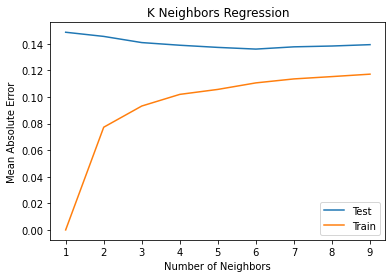

In [65]:
def KneighborsRegressionTuning():
    
    trainMAE, testMAE= [], []
    bestIndex = 0
    minMAE = float('inf')
    for i in list(range(1,10)):
        KNN = KNeighborsRegressor(n_neighbors=i)
        KNN = KNN.fit(X_train, y_train)
        test_predict = KNN.predict(X_test)
        train_predict = KNN.predict(X_train)
        testMAE.append(metrics.mean_absolute_error(y_test, test_predict))
        if metrics.mean_absolute_error(y_test, test_predict) < minMAE:
            minMAE = metrics.mean_absolute_error(y_test, test_predict)
            bestIndex = i
        trainMAE.append(metrics.mean_absolute_error(y_train, train_predict))

    plt.plot(list(range(1, 10)), testMAE, label='Test')
    plt.plot(list(range(1, 10)), trainMAE, label='Train')
    plt.ylabel('Mean Absolute Error')
    plt.xlabel('Number of Neighbors')
    plt.title('K Neighbors Regression')
    plt.legend()
    plt.show()
    
KneighborsRegressionTuning()

In [70]:
def KneighborsRegressionMethod(bestNumofNeighbor):
    
    KNN = KNeighborsRegressor(n_neighbors = bestNumofNeighbor)
    KNN = KNN.fit(X_train, y_train)
    test_predict = KNN.predict(X_test)
    train_predict = KNN.predict(X_train)
   
    return test_predict, train_predict

bestNumofNeighbor = 10
test_predict, train_predict = KneighborsRegressionMethod(bestNumofNeighbor)
result = evaluation(y_train, train_predict, y_test, test_predict)
result

,Train Dataset,Test Dataset
Mean Absolute Error,0.119465,0.139994
Mean Squared Error,0.0302557,0.03992
Root Mean Squared Error,0.173942,0.1998


## Decision Tree Regression

Decision Trees are a non-parametric supervised learning method used for classification and regression. The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features. Here, I try to tune `max_depth` parameter to find best depth that our model can train. As we can see from result after third depth, data get overfitted. So, I use `3` as best depth for our model.

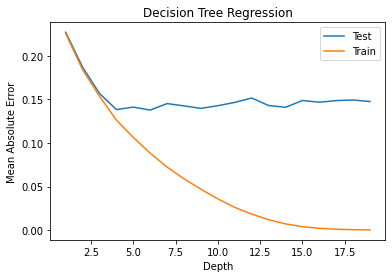

In [80]:
def DecisionTreeRegressionTuning():
    
    trainMAE, testMAE= [], []
    bestIndex = 0
    minMAE = float('inf')
    for i in list(range(1,20)):
        reg = tree.DecisionTreeRegressor(max_depth=i)
        reg = reg.fit(X_train, y_train)
        test_predict = reg.predict(X_test)
        train_predict = reg.predict(X_train)
        testMAE.append(metrics.mean_absolute_error(y_test, test_predict))
        if metrics.mean_absolute_error(y_test, test_predict) < minMAE:
            minMAE = metrics.mean_absolute_error(y_test, test_predict)
            bestIndex = i
        trainMAE.append(metrics.mean_absolute_error(y_train, train_predict))

    plt.plot(list(range(1, 20)), testMAE, label='Test')
    plt.plot(list(range(1, 20)), trainMAE, label='Train')
    plt.ylabel('Mean Absolute Error')
    plt.xlabel('Depth')
    plt.title('Decision Tree Regression')
    plt.legend()
    plt.show()

DecisionTreeRegressionTuning()

In [83]:
def DecisionTreeRegressionMethod(best_depth):
    reg = tree.DecisionTreeRegressor(max_depth = best_depth)
    reg = reg.fit(X_train, y_train)
    test_predict = reg.predict(X_test)
    train_predict = reg.predict(X_train)
    
    return test_predict, train_predict

best_depth = 3
test_predict, train_predict = DecisionTreeRegressionMethod(best_depth)
result = evaluation(y_train, train_predict, y_test, test_predict)
result

,Train Dataset,Test Dataset
Mean Absolute Error,0.15362,0.156845
Mean Squared Error,0.0416647,0.0404895
Root Mean Squared Error,0.204119,0.20122


### Overfitting in Machine Learning

`Overfitting` refers to a model that models the training data too well.

Overfitting happens when a model learns the detail and noise in the training data to the extent that it negatively impacts the performance of the model on new data. This means that the noise or random fluctuations in the training data is picked up and learned as concepts by the model. The problem is that these concepts do not apply to new data and negatively impact the models ability to generalize.

Overfitting is more likely with nonparametric and nonlinear models that have more flexibility when learning a target function. As such, many nonparametric machine learning algorithms also include parameters or techniques to limit and constrain how much detail the model learns.

For example, decision trees are a nonparametric machine learning algorithm that is very flexible and is subject to overfitting training data. This problem can be addressed by pruning a tree after it has learned in order to remove some of the detail it has picked up.

### Underfitting in Machine Learning

Underfitting refers to a model that can neither model the training data nor generalize to new data.

An underfit machine learning model is not a suitable model and will be obvious as it will have poor performance on the training data.

Underfitting is often not discussed as it is easy to detect given a good performance metric. The remedy is to move on and try alternate machine learning algorithms. Nevertheless, it does provide a good contrast to the problem of overfitting.

### How To Limit Overfitting

Both overfitting and underfitting can lead to poor model performance. But by far the most common problem in applied machine learning is overfitting.

Overfitting is such a problem because the evaluation of machine learning algorithms on training data is different from the evaluation we actually care the most about, namely how well the algorithm performs on unseen data.

There are two important techniques that you can use when evaluating machine learning algorithms to limit overfitting: 
<ul>    
    <li> Use a resampling technique to estimate model accuracy.</li>
    <li> Hold back a validation dataset. </li>
</ul>

The most popular resampling technique is k-fold cross validation. It allows you to train and test your model k-times on different subsets of training data and build up an estimate of the performance of a machine learning model on unseen data.

A validation dataset is simply a subset of your training data that you hold back from your machine learning algorithms until the very end of your project. After you have selected and tuned your machine learning algorithms on your training dataset you can evaluate the learned models on the validation dataset to get a final objective idea of how the models might perform on unseen data.

Using cross validation is a gold standard in applied machine learning for estimating model accuracy on unseen data. 

<ul>
    <li> Cross Validation: Using 12-fold cross-validation </li>
</ul>

## Random Forest Regression

In random forests, each tree in the ensemble is built from a sample drawn with replacement (i.e., a bootstrap sample) from the training set. Furthermore, when splitting each node during the construction of a tree, the best split is found either from all input features or a random subset of size `max_features`.  Here, I try to tune `max_depth` parameter to find best depth that our model can train. As we can see from result as depth go further, we have better result. So, I use `20` as best depth for our model. If I have more time I would check for best depth.

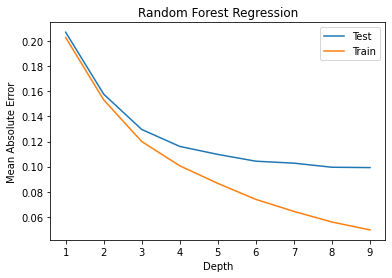

In [75]:
def RandomForestRegressionTuning():
    
    trainMAE, testMAE= [], []
    bestIndex = 0
    minMAE = float('inf')
    for i in list(range(1,10)):
        RFreg = RandomForestRegressor(max_depth=i)
        RFreg = RFreg.fit(X_train, y_train)
        test_predict = RFreg.predict(X_test)
        train_predict = RFreg.predict(X_train)
        testMAE.append(metrics.mean_absolute_error(y_test, test_predict))
        if metrics.mean_absolute_error(y_test, test_predict) < minMAE:
            minMAE = metrics.mean_absolute_error(y_test, test_predict)
            bestIndex = i
        trainMAE.append(metrics.mean_absolute_error(y_train, train_predict))

    plt.plot(list(range(1, 10)), testMAE, label='Test')
    plt.plot(list(range(1, 10)), trainMAE, label='Train')
    plt.ylabel('Mean Absolute Error')
    plt.xlabel('Depth')
    plt.title('Random Forest Regression')
    plt.legend()
    plt.show()
    
RandomForestRegressionTuning()

In [85]:
def RandomForestRegressionMethod(best_depth):
    reg = RandomForestRegressor(max_depth = best_depth)
    reg = reg.fit(X_train, y_train)
    test_predict = reg.predict(X_test)
    train_predict = reg.predict(X_train)
    
    return test_predict, train_predict, reg

best_depth = 20
test_predict, train_predict, reg = RandomForestRegressionMethod(best_depth)
result = evaluation(y_train, train_predict, y_test, test_predict)
result

,Train Dataset,Test Dataset
Mean Absolute Error,0.0355779,0.097267
Mean Squared Error,0.00272877,0.0181991
Root Mean Squared Error,0.0522376,0.134904


<h2 >DecisionTreeRegressor <h2 >


<h3 > Gridsearch <h3/ >

In [58]:
from sklearn.tree import DecisionTreeRegressor

parameters = { 'max_depth' : range(3,10,1),
              'max_features' : range(5,15,1)
             }
            
dtree_reg = GridSearchCV(DecisionTreeRegressor(), parameters, cv=12, refit=True, verbose=1,
                         scoring = 'neg_mean_squared_error')
dtree_reg.fit(X_train, y_train)

sc_dtree_reg = get_best_score(dtree_reg)

Fitting 12 folds for each of 70 candidates, totalling 840 fits
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
0.2231563800894371
{'max_depth': 6, 'max_features': 14}
DecisionTreeRegressor(max_depth=6, max_features=14)
[Parallel(n_jobs=1)]: Done 840 out of 840 | elapsed:    2.9s finished


<h3 > run DecisionTreeRegressor with best score <h3/ > 

R2 (explained variance): 0.74
Mean Absolute Perc Error (Σ(|y-pred|/y)/n): 0.037120035870889745
Mean Absolute Error (Σ|y-pred|/n): 0.159039
Root Mean Squared Error (sqrt(Σ(y-pred)^2/n)): 0.209294
Max Error: [0.87451717]
No handles with labels found to put in legend.


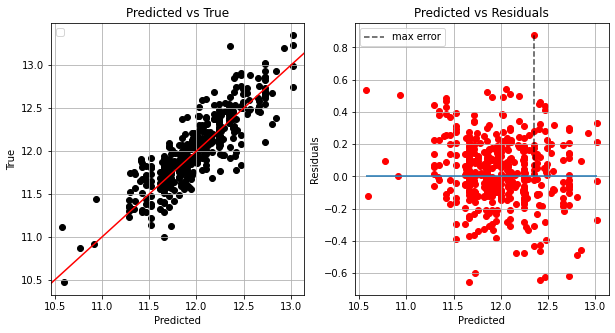

In [59]:
## DecisionTreeRegressor
dtree_reg = DecisionTreeRegressor(max_depth=9, max_features=12)
## fit the model. 
dtree_reg.fit(X_train, y_train)
## Predicting the target value based on "Test_x"
y_pred = dtree_reg.predict(X_test)

model_evaluation(y_pred)

<h2 > RandomForestRegressor <h2/ >

<h3 > Gridsearch <h3/ > 

In [60]:
from sklearn.ensemble import RandomForestRegressor

param_grid = {'min_samples_split' : range(2,11,1),
              'n_estimators' : range(5,100,5),
              'random_state': [5] }
grid_rf = GridSearchCV(RandomForestRegressor(), param_grid, cv=12, refit=True,
                       verbose=1, scoring = 'neg_mean_squared_error')
grid_rf.fit(X_train, y_train)

sc_rf = get_best_score(grid_rf)

Fitting 12 folds for each of 171 candidates, totalling 2052 fits
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


KeyboardInterrupt: 

<h3 > run RandomForestRegressor with best score <h3/ > 

No handles with labels found to put in legend.
R2 (explained variance): 0.89
Mean Absolute Perc Error (Σ(|y-pred|/y)/n): 0.03689802776714805
Mean Absolute Error (Σ|y-pred|/n): 0.098776
Root Mean Squared Error (sqrt(Σ(y-pred)^2/n)): 0.137045
Max Error: [-0.61216164]


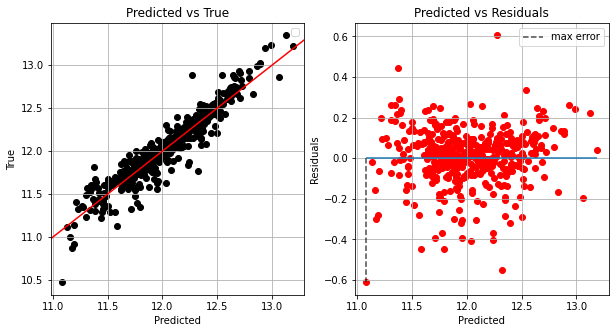

In [57]:
## DecisionTreeRegressor
rf_reg = RandomForestRegressor(min_samples_split=2, n_estimators=95, random_state=5)
## fit the model. 
rf_reg.fit(X_train, y_train)
## Predicting the target value based on "Test_x"
y_pred = rf_reg.predict(X_test)

model_evaluation(y_pred)